# Assignment 4
The notebook contains solution of DIP as a report

# Nesscary Imports and helper functions

In [2]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import cv2
%matplotlib inline

In [553]:
# Load Image and convert to numpy array
def load_image(path,is_gray=False,resize=None):
    im = Image.open(path)
    if resize :
        im = im.resize(resize)
    
    if is_gray:
        im = im.convert('L')
    else:
        im = im.convert('RGB')
        
    return np.array(im)

# Display N,M items in matplotlib
def display_images(images,dim):
    rows, columns = dim
    fig=plt.figure(figsize=(8*columns, 8*rows))
    for i in range(1, columns*rows +1):
        img = images[i-1]
        fig.add_subplot(rows, columns, i)
#         For grayscale images        
        if len(im.shape) == 2:
            plt.imshow(img,cmap='gray')
        else:
            plt.imshow(img)
            
        plt.axis('off')
    plt.show()
    
def display_mask(im,old_mask):
    
    fig = plt.figure(figsize=(8,8))
    
    fig.add_subplot(1, 2, 1)
    plt.imshow(im,cmap='gray')
    plt.title('Original')
    plt.axis('off')
    
    mask = old_mask.copy()
    mask[np.where(mask==0)]=np.nan    
    fig.add_subplot(1, 2, 2)
    plt.imshow(mask,cmap='rainbow')
    plt.title('Mask')
    plt.axis('off')
    
    plt.show()


## Question 1: Skeletonization

    1. Implementing Thinning
    2. Implementing Hit-or-miss transform

In [4]:
# Applies the hit and miss algorithm for the sliding window operation
def hit_or_miss(m,fil):
    if m.shape != fil.shape:
        print("Error: Filter and input shape different")
    h,w = m.shape
    for i in range(h):
        for j in range(w):
            if fil[i,j]!=-1 and m[i,j]!=fil[i,j]:
                return False
    return True

# Convolution using hit and miss algorithm
def conv_hit_or_miss(im,fil):
    new_im = im.copy()
    h,w = new_im.shape
    for i in range(1,h-1):
        for j in range(1,w-1):
            if hit_or_miss(im[i-1:i+2,j-1:j+2],fil):
                new_im[i,j] = 0
            
    
    return new_im 

# Apply Skeletonization
def skeletonization(im,S1,S2,threshold=1):
    # Binarize using global thresholding at 127
    bin_im = (im < 127).astype(np.uint8)

#     Loop until change is minute
    while True:

#         Apply both filters, rotating it 90 degress and apply again 
        new_im = bin_im
        for i in range(4):
            new_im = conv_hit_or_miss(new_im,S1)    
            new_im = conv_hit_or_miss(new_im,S2)    
            S1 = np.rot90(S1)
            S2 = np.rot90(S2)

        # Stop chaning image when change < 1     
        change = np.mean(np.abs(new_im-bin_im))
        print("Change:",change)
#         Display images
        if change <= threshold: 
            break
        else:
            bin_im = new_im
    
    bin_im = (im < 127).astype(np.uint8)
    display_images([bin_im,new_im],(1,2)) 
    return new_im

Change: 26.473515625
Change: 24.457421875
Change: 17.243046875
Change: 8.976796875
Change: 2.965703125
Change: 0.66671875


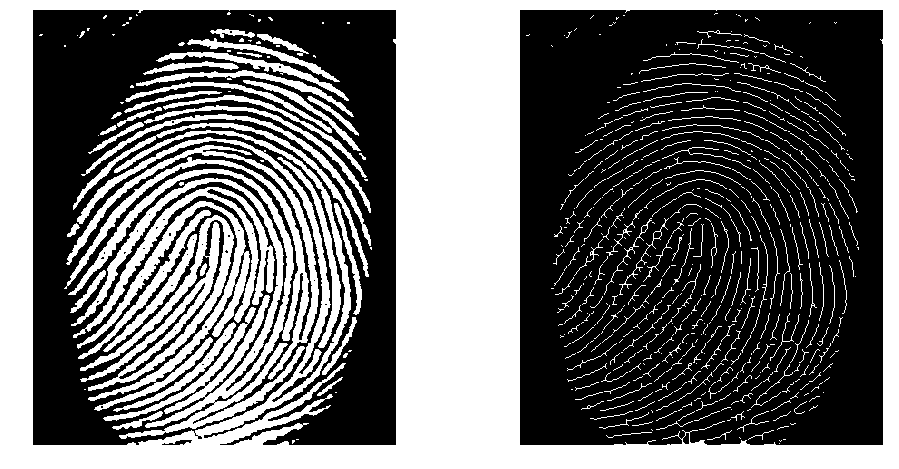

In [60]:
# Load images
im = load_image('./images/fingerprint.jpg',is_gray=True)
# Structuring Elements
S1 = np.array([
            [0,0,0],
            [-1,1,-1],
            [1,1,1]])
S2 = np.array([
            [-1,0,0],
            [1,1,0],
            [-1,1,-1]])

# Apply skeletonization
skel_im = skeletonization(im,S1,S2) 

### Q1. 2
    S1: To detect edges and other curves which are close to being edge, curves etc. 
    S2: We use this structuring element to detect right angled triangles
       
### Q1.3
    1. Rotation by 90 is required to detect horizontal and vector edges and right hand corners
    2. More iterations give thinner result. Hence more iterations thinner the skeleton.
### Q1.4    

# Image of solid body

Change: 5.7530688719472804
Change: 5.746478873239437
Change: 5.7003488822845325
Change: 5.657513890683551
Change: 5.601498901666882
Change: 5.561958909419822
Change: 5.466403928156092
Change: 5.4334539346168755
Change: 5.403798940431581
Change: 5.32471895593746
Change: 5.215983977258044
Change: 5.061119007623724
Change: 3.6541542834991603
Change: 2.7381444631089287
Change: 2.0593745962010597
Change: 1.7792996511177155
Change: 1.6474996769608476
Change: 1.5980746866520221
Change: 1.5486496963431968
Change: 1.5058147047422148
Change: 1.449799715725546
Change: 1.3904897273549555
Change: 1.3806047292931902
Change: 1.3114097428608347
Change: 1.2751647499676961
Change: 1.2488047551363226
Change: 1.1960847654735753
Change: 1.1697247706422018
Change: 1.1400697764569065
Change: 1.0972347848559245
Change: 1.0576947926088642
Change: 1.0247447990696472
Change: 1.018154800361804
Change: 0.9720248094069002


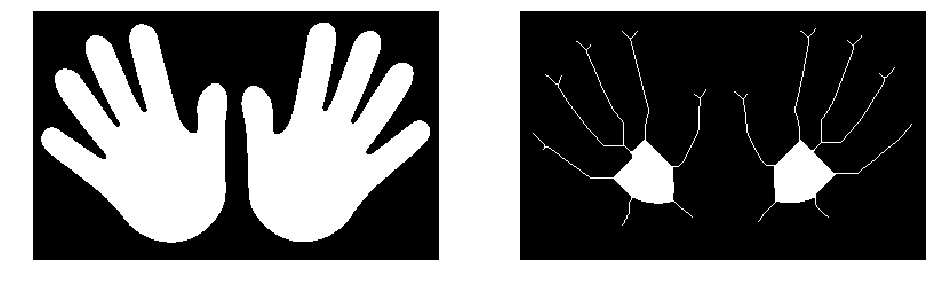

In [62]:
# On other Images, same struturing elements
im = load_image('./images/hand.jpg',is_gray=True)
skel_im = skeletonization(255-im,S1,S2)  

## Image with holes

Change: 12.07425
Change: 9.34575
Change: 8.0835
Change: 7.350375
Change: 6.661875
Change: 5.922375
Change: 5.437875
Change: 4.940625
Change: 4.539
Change: 4.264875
Change: 4.124625
Change: 3.984375
Change: 3.78675
Change: 3.652875
Change: 3.4935
Change: 3.346875
Change: 3.2385
Change: 3.20025
Change: 3.142875
Change: 3.104625
Change: 3.040875
Change: 2.964375
Change: 2.89425
Change: 2.773125
Change: 1.472625


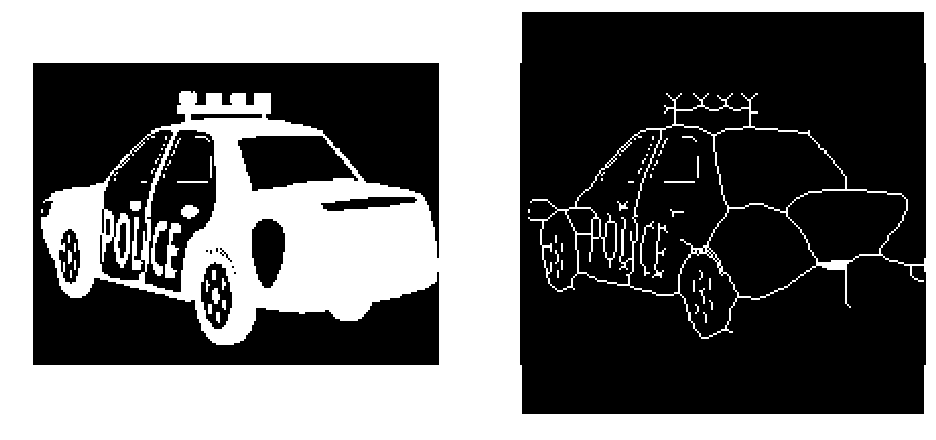

In [79]:
im = load_image('./images/car.jpg',is_gray=True,resize=(200,200))
skel_im = skeletonization(im,S1,S2,threshold=2.5)

# Thin Image

Change: 0.8953333333333333


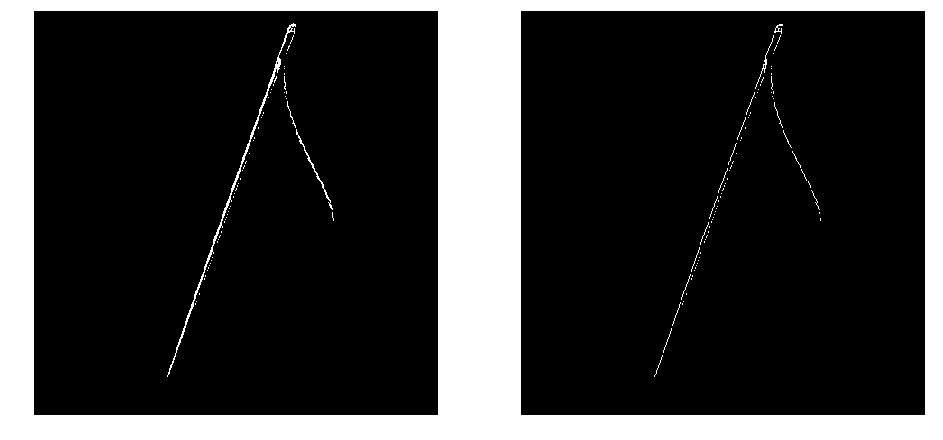

In [71]:
im = load_image('./images/needle.jpg',is_gray=True)
skel_im = skeletonization(255 - im,S1,S2)

# Irregular Object

Change: 7.344
Change: 7.45875
Change: 6.79575
Change: 6.661875
Change: 6.496125
Change: 6.48975
Change: 6.215625
Change: 5.731125
Change: 5.386875
Change: 5.06175
Change: 4.692
Change: 4.277625
Change: 4.04175
Change: 3.716625
Change: 3.525375
Change: 3.04725
Change: 2.76675
Change: 2.696625
Change: 2.530875
Change: 2.339625
Change: 2.122875
Change: 1.92525
Change: 1.53
Change: 1.31325
Change: 0.771375


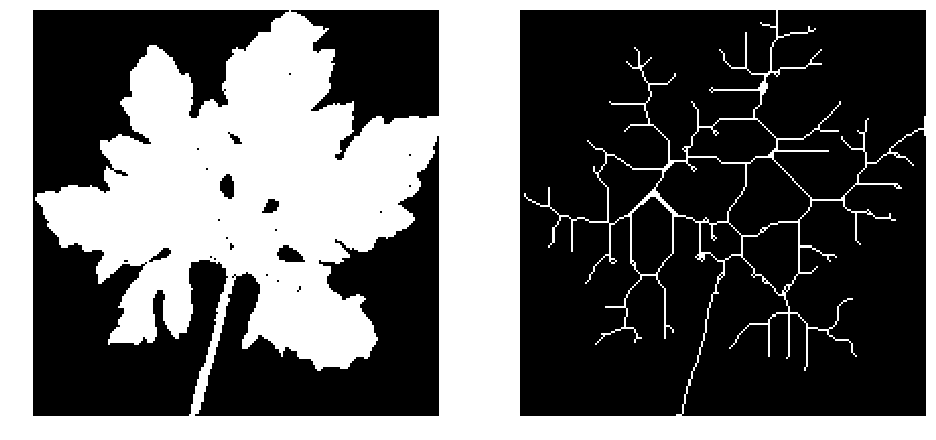

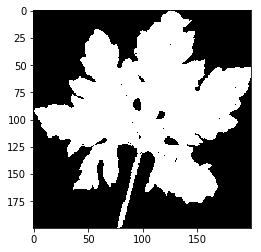

In [78]:
im = load_image('./images/leaf.jpg',is_gray=True,resize=(200,200))
skel_im = skeletonization(im,S1,S2)

# Question 2 (Counting Coins)


In [309]:
def connected_components(binary_image):
    """
        Runs connected components on the given binary image and returns a mask. This mask shows the components of image
        assumging 4 neigbours
    """
    
    union_find = {}
    num_components = 1
    h,w = binary_image.shape
    mask = np.zeros((h,w))
    
    for i in range(h):
        for j in range(w):
            if binary_image[i,j]==1:
    #             First element
                if i==0 and j==0:
                    mask[i,j] = num_components
    #         First row
                elif i==0 and mask[i,j-1]!=0:
                    mask[i,j] = mask[i,j-1]
    #         First column
                elif j==0 and mask[i-1,j]!=0:
                    mask[i,j] = mask[i-1,j]
    #             Any one of them is 0
                elif mask[i-1,j] == 0  and mask[i,j-1] != 0:
                    mask[i,j] = mask[i,j-1]
                elif mask[i-1,j] != 0  and mask[i,j-1] == 0:
                    mask[i,j] = mask[i-1,j]
                elif mask[i-1,j] != mask[i,j-1]:
                    union_find[max(mask[i-1,j], mask[i,j-1])] = min(mask[i-1,j], mask[i,j-1]) 
                    mask[i,j] = min(mask[i-1,j], mask[i,j-1]) 
                else:
                    num_components = num_components + 1
                    mask[i,j] = num_components

#     print(union_find)
    def find_component(union_find,child,parent):
#         print(child,parent)
        if child in union_find:
            return find_component(union_find ,union_find[child],parent)
        else:
#             union_find[parent] = child
            return child
    for i in range(h):
        for j in range(w):
            if mask[i,j]:
                mask[i,j] = find_component(union_find,mask[i,j],mask[i,j])
            
    return mask

## Load Image and calculate the mask 

In [76]:
im = load_image('./images/coins_binary.jpg',is_gray=True)
mask = connected_components(im>127)

## Mask of the object after 2 pass (different color shows different object)

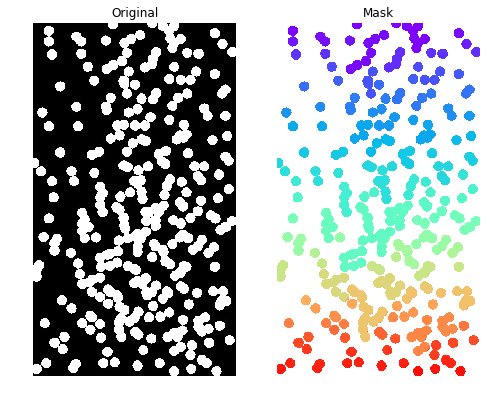

In [77]:
display_mask(im,mask)

# Coins touching the boundary

    All mask elements touching the boundary(non zero at boundary)  

In [72]:
im = load_image('./images/coins_binary.jpg',is_gray=True)
im = (im>127).astype(np.uint8)

{2.0, 3.0, 6665.0, 2065.0, 6674.0, 6163.0, 6676.0, 6675.0, 2074.0, 29.0, 30.0, 3362.0, 426.0, 3372.0, 47.0, 3251.0, 6581.0, 6582.0, 55.0, 64.0, 6216.0, 76.0, 6223.0, 2010.0, 6622.0, 6624.0, 4349.0}


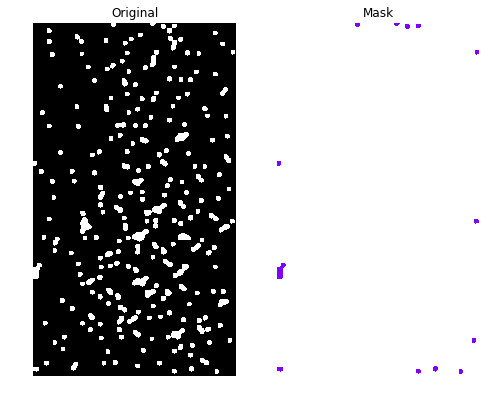

In [73]:
st_em = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
# er_im = cv2.morphologyEx(im, cv2.MORPH_OPEN, st_em,iterations=2)
er_im = cv2.erode(im,st_em,iterations=2)
st_em = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10,10))
er_im = cv2.dilate(er_im,st_em,iterations=1)
mask = connected_components(er_im)

# Loop over boundary
boundary_components = set()
h,w = mask.shape
for i in range(h):
    for j in range(10):
        if mask[i,j]:
            boundary_components.add(mask[i,j])
        if mask[i,w-1-j]:
            boundary_components.add(mask[i,w-1-j])

for i in range(w):
    for j in range(10):
        if mask[j,i]:
            boundary_components.add(mask[j,i])
        if mask[h-1-j,i]:
            boundary_components.add(mask[h-1-j,i])        

print(boundary_components)
boundary_components = list(boundary_components)
boundary_mask = np.zeros_like(mask)

for x in boundary_components:
    boundary_mask[np.where(mask==x)] = 1
display_mask(er_im,boundary_mask)

# Overlapping Coins & Non-overlapping Coins
    If the area of the segment is greater than area of one circle, then we will call it overlapping

In [101]:
h,w = mask.shape
components_area = {}
for i in range(h):
    for j in range(w):
        if mask[i,j] and mask[i,j] in components_area:
            components_area[mask[i,j]] += 1
        elif mask[i,j] and mask[i,j] not in components_area:
            components_area[mask[i,j]] = 1
            
overlapping_mask = np.zeros_like(mask)
non_overlapping_mask = np.zeros_like(mask)

for x in components_area:    
    if components_area[x] > 450:
        overlapping_mask[np.where(mask==x)] = 1
    else:
        non_overlapping_mask[np.where(mask==x)] = 1

# Overlappin Mask

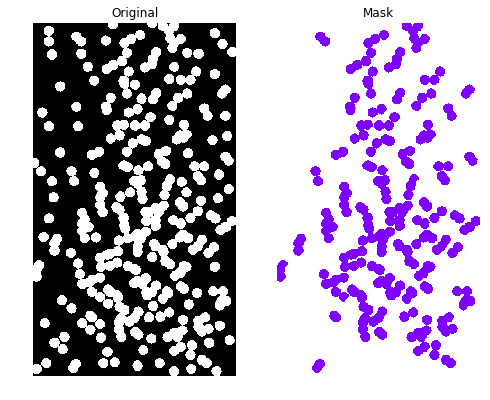

In [102]:
display_mask(im,overlapping_mask)

# Non overlapping mask

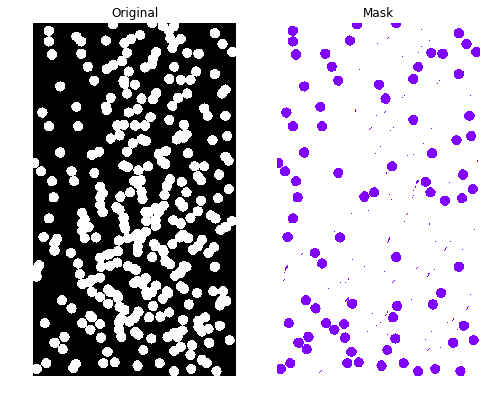

In [103]:
display_mask(im,non_overlapping_mask)

# Question 3 (More Connected Components)
    Sort the colors in the image take the first 5 except the background

3


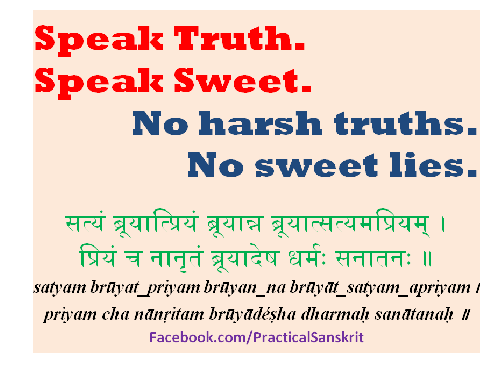

In [539]:
# Load image and remove the boundary
im = load_image('./images/fbpost.png')
h,w = im.shape[0:2]
m = 20
im = im[m:h-m,m:w-m]
display_images([im],(1,1))

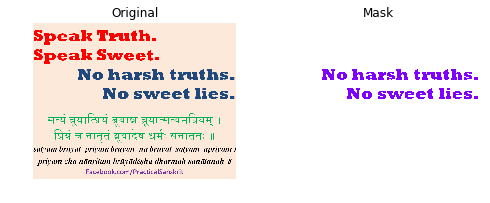

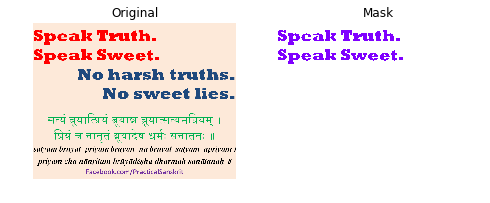

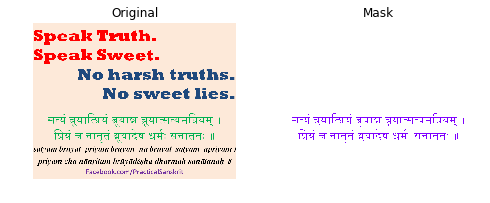

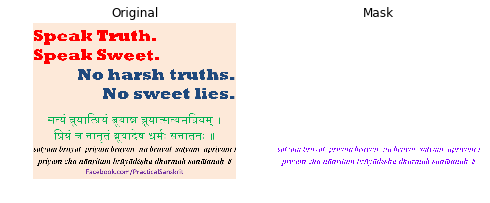

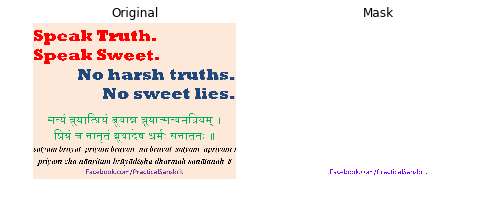

In [540]:
color, colorcnt = np.unique(im.reshape(-1, im.shape[2]), axis=0, return_counts=True);
idx = np.flipud(np.argsort(colorcnt))
color = color[idx[1:6],:]

# Create mask for each case
h,w = im.shape[0:2]
bin_im = np.zeros((5,im.shape[0],im.shape[1]))
for k,c in enumerate(color):
    for i in range(h):
        for j in range(w):
            if np.array_equal(im[i,j,:],c):
                bin_im[k,i,j] = 1
    display_mask(im,bin_im[k])

# 8 connected components

In [617]:
def eight_connected_components(binary_image):
    """
        Runs connected components on the given binary image and returns a mask. This mask shows the components of image
        assumging 4 neigbours
    """
    
    union_find = {}
    num_components = 1
    h,w = binary_image.shape
    binary_image = np.pad(binary_image,(0,1),'constant')
    mask = np.zeros((h+1,w+1))
    for i in range(h):
        for j in range(w):
            if binary_image[i,j]==1:
    #             First element
                if i==0 and j==0:
                    mask[i,j] = num_components
    #         First row
                elif i==0 and mask[i,j-1]!=0:
                    mask[i,j] = mask[i,j-1]
    #         First column
                elif j==0 and mask[i-1,j]!=0:
                    mask[i,j] = mask[i-1,j]
    #             Any one of them is 0
                
                elif mask[i,j-1] + mask[i-1,j-1] + mask[i-1,j] + mask[i-1,j+1] > 0:
                    ker = np.array([mask[i,j-1] , mask[i-1,j-1] , mask[i-1,j] , mask[i-1,j+1]])

                    if np.sum(ker==0) == 3:
                        mask[i,j] = ker[np.where(ker!=0)]
                    else:
                        mask[i,j] = min(ker[np.where(ker!=0)])
                    for k in ker:
                        if k != 0 and k!= mask[i,j]:
                            union_find[k] = mask[i,j]
        
                else:
                    num_components = num_components + 1
                    mask[i,j] = num_components
        
#     print(union_find)
    def find_component(union_find,child,parent):
#         print(child,parent)
        if child in union_find:
            return find_component(union_find ,union_find[child],parent)
        else:
#             union_find[parent] = child
            return child
    for i in range(h):
        for j in range(w):
            if mask[i,j]:
                mask[i,j] = find_component(union_find,mask[i,j],mask[i,j])

                
                
    components = set()
    h,w = mask.shape
    for i in range(h):
        for j in range(w):
            if mask[i,j]:
                components.add(mask[i,j])
    return mask,components

Components: 27


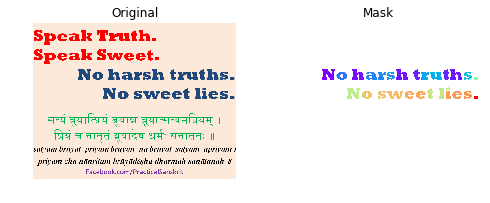

Components: 24


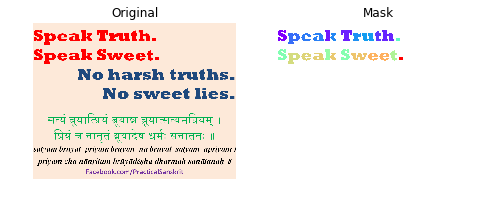

Components: 74


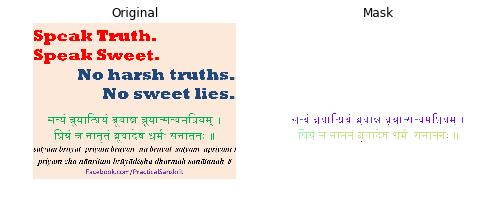

Components: 241


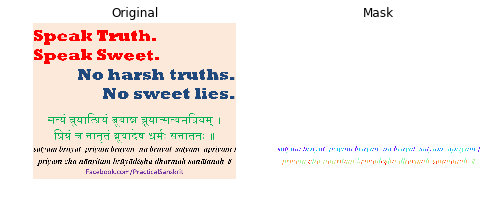

Components: 34


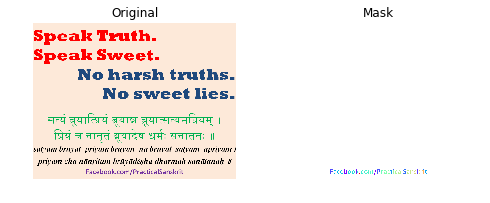

In [542]:
for i in range(5):
    mask,components = eight_connected_components(bin_im[i,...])
    print("Components:",len(components))
    display_mask(im,mask)

# Finding elements with holes

In [543]:
def find_holes(im,hole_num):
    fg_mask,fg_components = eight_connected_components(im)
    display_mask(im,fg_mask)
    bg_mask,bg_components = eight_connected_components(255-im)
    display_mask(im,bg_mask)
    


In [627]:
im = load_image('./images/handwriting-2.jpg',is_gray=True)
ret, bin_im = cv2.threshold(im,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
bin_im = 255 - bin_im
st_em = np.ones((6,3))
bin_im = cv2.erode(bin_im,st_em,iterations=1)
bin_im = cv2.dilate(bin_im,st_em,iterations=2)


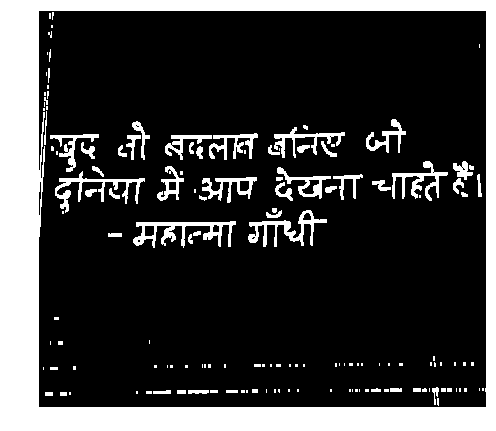

In [628]:
display_images([bin_im],(1,1))

/usr/local/lib/python3.5/dist-packages/matplotlib/image.py:405: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
/usr/local/lib/python3.5/dist-packages/matplotlib/image.py:406: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
/usr/local/lib/python3.5/dist-packages/matplotlib/image.py:412: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.5/dist-packages/matplotlib/image.py:417: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
/usr/local/lib/python3.5/dist-packages/matplotlib/colors.py:916: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
/usr/local/lib/python3.5/dist-packages/numpy/ma/core.py:716: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


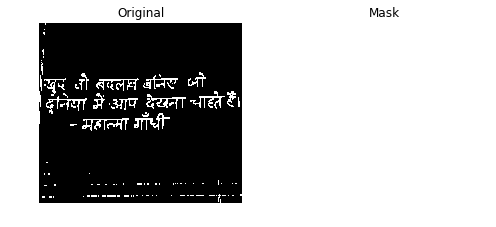

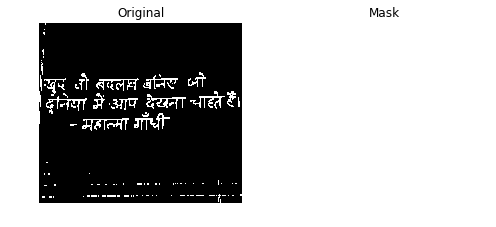

In [629]:
find_holes(bin_im,2)

# Question 4

## 1. After Image:
    An afterimage is an image that continues to appear in one's vision after the exposure to the original image has ceased.
#### Positive After Image
    Positive afterimages, by contrast, appear the same color as the original image. They are often very brief, lasting less than half a second. The cause of positive afterimages is not well known, but possibly reflects persisting activity in the brain when the retinal photoreceptor cells continue to send neural impulses to the occipital lobe.
#### Negative After Image
    Negative afterimages are caused when the eye's photoreceptors, primarily known as rods and cones, adapt to overstimulation and lose sensitivity. 
                 
## 2. Color Moire
    a moiré pattern or moiré fringes are large-scale interference patterns that can be produced when an opaque ruled pattern with transparent gaps is overlaid on another similar pattern. For the moiré interference pattern to appear, the two patterns must not be completely identical, but rather e.g. displaced, rotated or have slightly different pitch.
    
## 3. Structural coloration
    Structural coloration is the production of colour by microscopically structured surfaces fine enough to interfere with visible light, sometimes in combination with pigments. For example, peacock tail feathers are pigmented brown, but their microscopic structure makes them also reflect blue, turquoise, and green light.    

# Question 5

In [516]:
# Create our Image
im_hsi = np.zeros((1000,1000,3),dtype=np.uint8)
im_hsi_perceptual = np.zeros((1000,1000,3),dtype=np.uint8)
for i in range(1,11):
    for j in range(1,11):
        square = np.zeros((100,100,3),dtype=np.uint8)
#     S and I = 255
        square[:,:,1:3] = 255
        square[:,:,0] = 60 +  360*(i*10 + j-11)/100
        im_hsi[(i-1)*100:i*100,(j-1)*100:j*100,:] = square
        im_hsi_perceptual[(i-1)*100:i*100,(j-1)*100:j*100,0] = square[:,:,0] - 60
        im_hsi_perceptual[(i-1)*100:i*100,(j-1)*100:j*100,1:3] = 255
        
# Convert to rgb to display        
im_rgb = cv2.cvtColor(im_hsi,cv2.COLOR_HSV2RGB)
im_rgb_perceptual = cv2.cvtColor(im_hsi_perceptual,cv2.COLOR_HSV2RGB)        

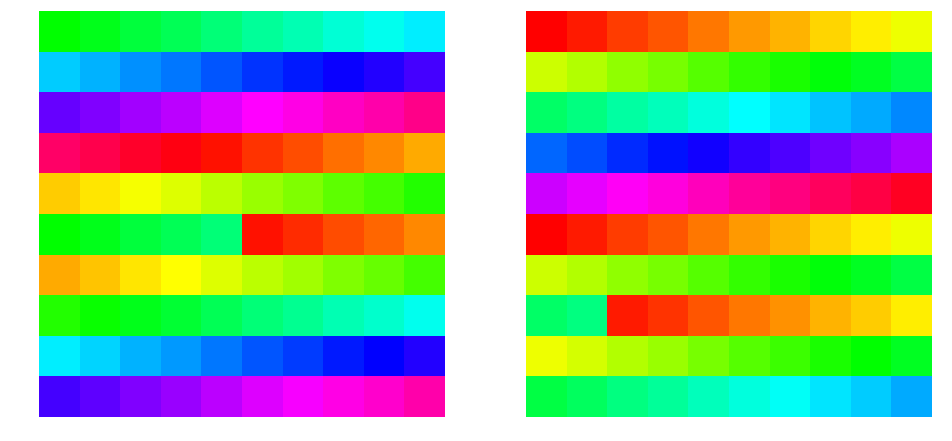

In [517]:
display_images([im_rgb,im_rgb_perceptual],(1,2))

We have higher sensivity for green color and hence we do not notice any step-like non gradual change in green but for red and blue we can notice it

# Question 6
    Different image types

In [554]:
def display_different_image_planes(im):
    neg_im = 255-im
    hsi = cv2.cvtColor(im,cv2.COLOR_RGB2HSV)
    lab = cv2.cvtColor(im,cv2.COLOR_RGB2LAB)
    display_images([
            im[:,:,0],im[:,:,1],im[:,:,2],
            neg_im[:,:,0],neg_im[:,:,1],neg_im[:,:,2],
            hsi[:,:,0],hsi[:,:,1],hsi[:,:,2],
            lab[:,:,0],lab[:,:,1],lab[:,:,2],
            ],(4,3))

# Color Bars

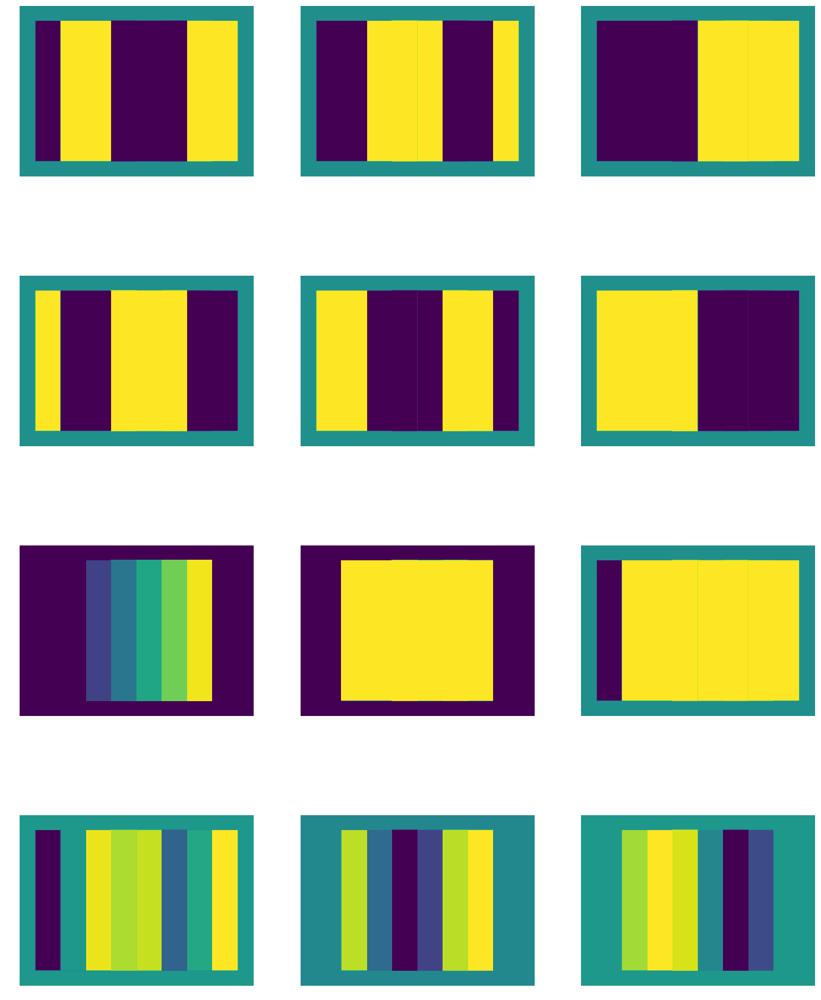

In [555]:
im = load_image('./images/color_bars.tif')
display_different_image_planes(im)

# Pepper

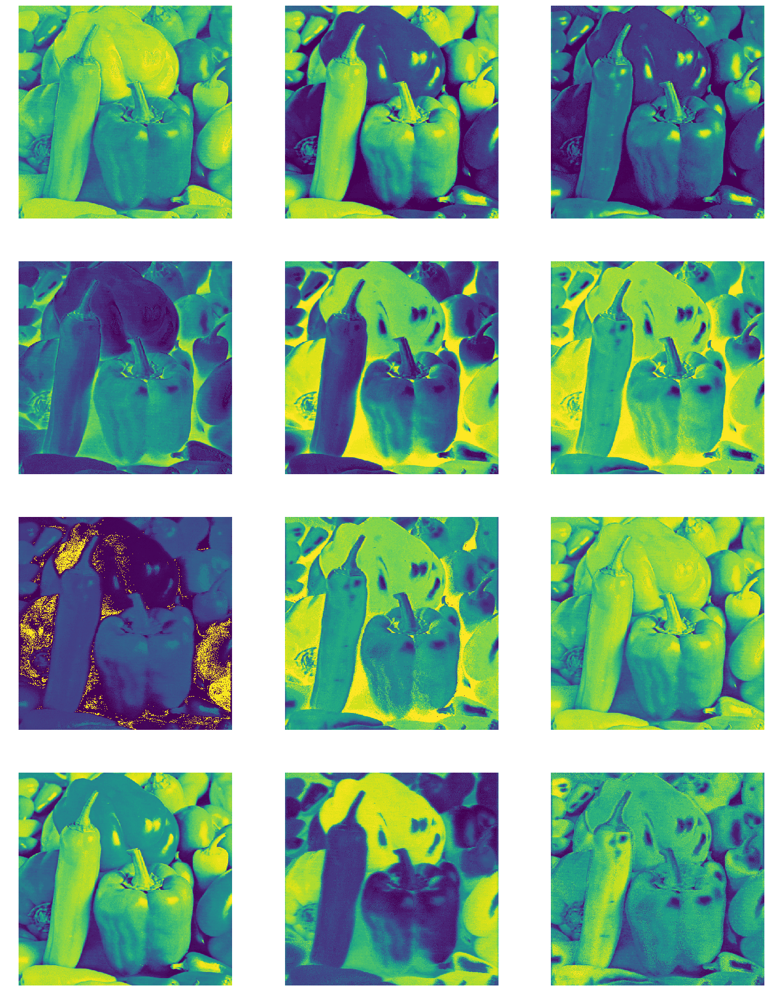

In [559]:
im = load_image('./images/peppers_color.png')
display_different_image_planes(im)

# Mandril

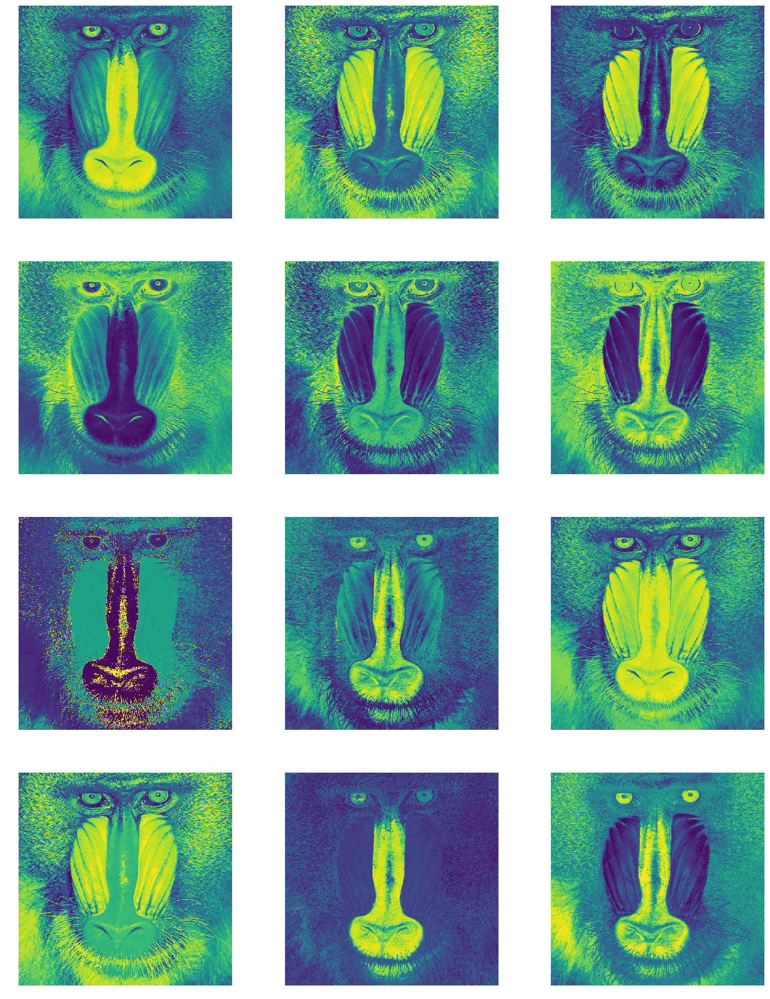

In [560]:
im = load_image('./images/mandril_color.tif')
display_different_image_planes(im)

# 2. Safe RGB

In [570]:
def safeRGB(im):
    im = 51*np.floor(im/51)
    return im.astype('int')

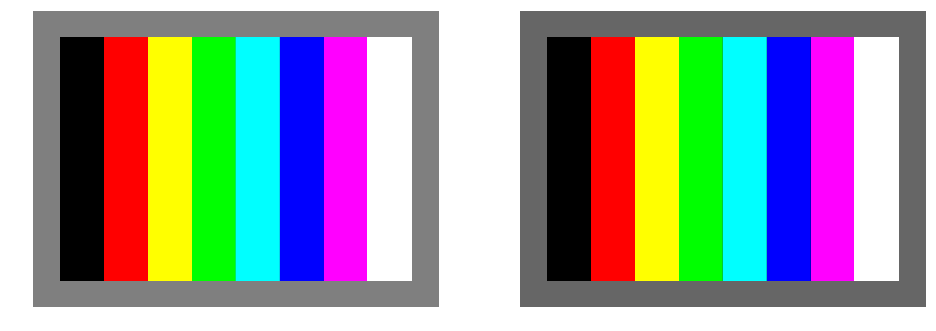

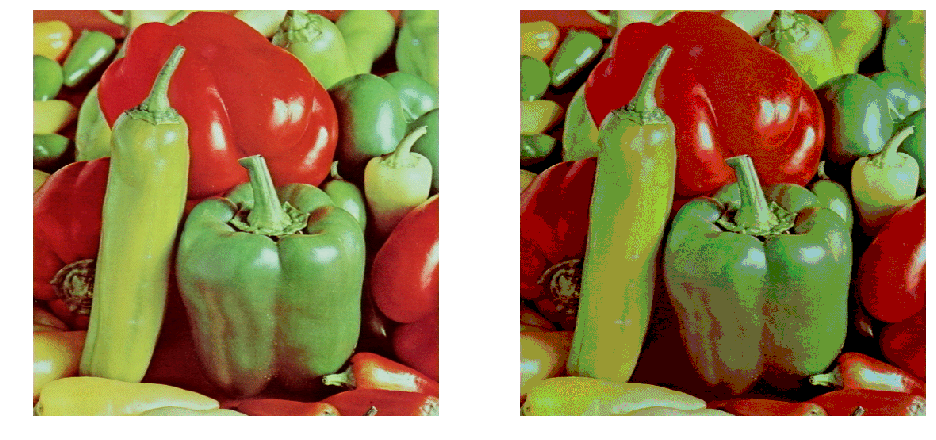

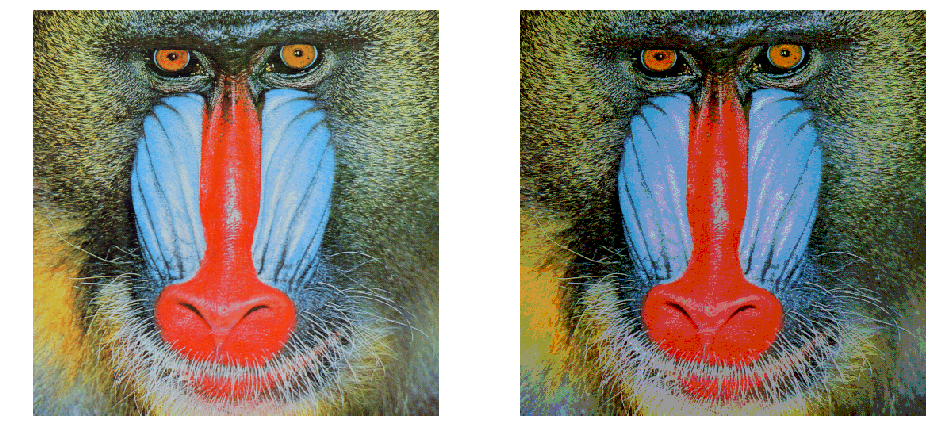

In [574]:
im = load_image('./images/color_bars.tif')
display_images([im,safeRGB(im)],(1,2))
im = load_image('./images/peppers_color.png')
display_images([im,safeRGB(im)],(1,2))
im = load_image('./images/mandril_color.tif')
display_images([im,safeRGB(im)],(1,2))

# Histogtam equalization

In [594]:
# Bucket sort for images
def bucket_sort(im_list):
	buckets = np.zeros((256))
	for x in im_list:
		buckets[x] += 1
	return buckets

def histogram(im):
    w,h = im.shape
    y = bucket_sort(np.reshape(im,(w*h,1)) )
    y = y/(w*h)
    return np.array(y)

def histogram_equalization(im):
	h,w = im.shape    
	new_im = np.zeros_like(im)
	hist = histogram(im)    
	cum_hist = np.cumsum(hist)
	for j in range(h):
		for i in range(w):
			new_im[j,i] = cum_hist[im[j,i]]*255 
	return new_im

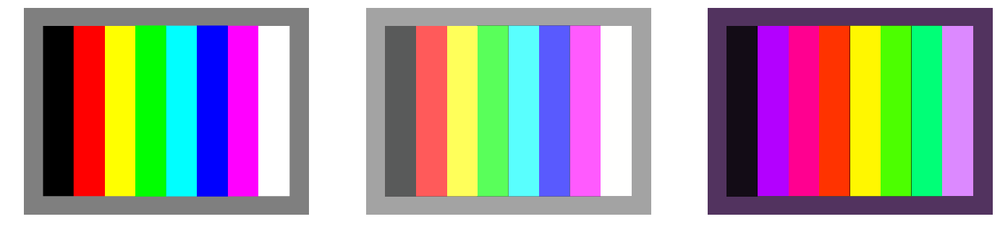

In [605]:
im = load_image('./images/color_bars.tif')
new_im = np.zeros_like(im)
new_im[:,:,0] = histogram_equalization(im[:,:,0])
new_im[:,:,1] = histogram_equalization(im[:,:,1])
new_im[:,:,2] = histogram_equalization(im[:,:,2])

hsi = cv2.cvtColor(im,cv2.COLOR_RGB2HSV)
new_im_hsi = np.zeros_like(hsi)
new_im_hsi[:,:,0] = histogram_equalization(hsi[:,:,0])
new_im_hsi[:,:,1] = histogram_equalization(hsi[:,:,1])
new_im_hsi[:,:,2] = histogram_equalization(hsi[:,:,2])
rgb = cv2.cvtColor(new_im_hsi,cv2.COLOR_HSV2RGB)
display_images([im,new_im,rgb],(1,3))

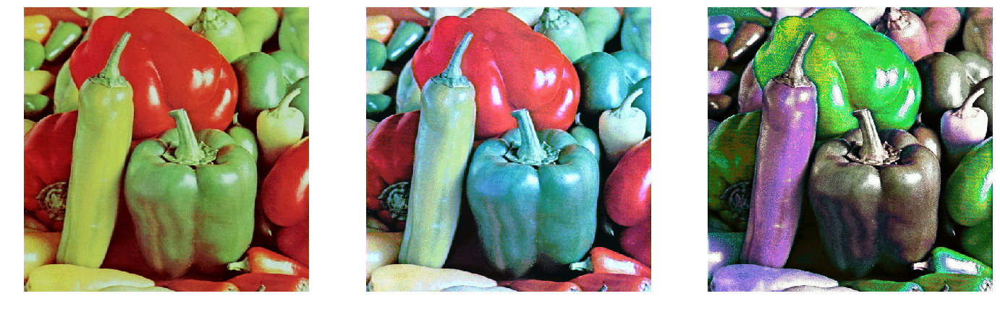

In [604]:
im = load_image('./images/peppers_color.png')
new_im = np.zeros_like(im)
new_im[:,:,0] = histogram_equalization(im[:,:,0])
new_im[:,:,1] = histogram_equalization(im[:,:,1])
new_im[:,:,2] = histogram_equalization(im[:,:,2])

hsi = cv2.cvtColor(im,cv2.COLOR_RGB2HSV)
new_im_hsi = np.zeros_like(hsi)
new_im_hsi[:,:,0] = histogram_equalization(hsi[:,:,0])
new_im_hsi[:,:,1] = histogram_equalization(hsi[:,:,1])
new_im_hsi[:,:,2] = histogram_equalization(hsi[:,:,2])
rgb = cv2.cvtColor(new_im_hsi,cv2.COLOR_HSV2RGB)
display_images([im,new_im,rgb],(1,3))

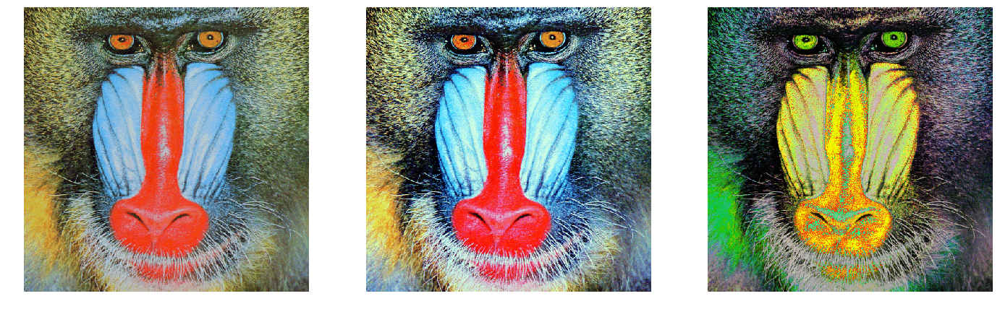

In [603]:
im = load_image('./images/mandril_color.tif')
new_im = np.zeros_like(im)
new_im[:,:,0] = histogram_equalization(im[:,:,0])
new_im[:,:,1] = histogram_equalization(im[:,:,1])
new_im[:,:,2] = histogram_equalization(im[:,:,2])

hsi = cv2.cvtColor(im,cv2.COLOR_RGB2HSV)
new_im_hsi = np.zeros_like(hsi)
new_im_hsi[:,:,0] = histogram_equalization(hsi[:,:,0])
new_im_hsi[:,:,1] = histogram_equalization(hsi[:,:,1])
new_im_hsi[:,:,2] = histogram_equalization(hsi[:,:,2])
rgb = cv2.cvtColor(new_im_hsi,cv2.COLOR_HSV2RGB)
display_images([im,new_im,rgb],(1,3))

# 6.d Not change H and S

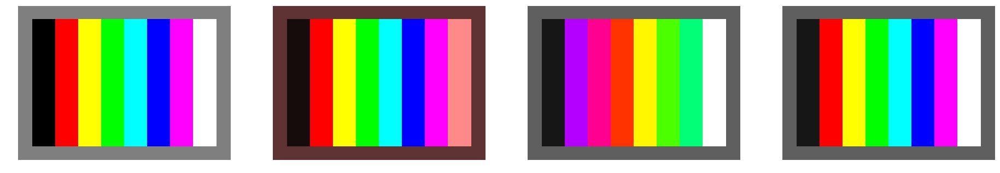

In [612]:
im = load_image('./images/color_bars.tif')

hsi = cv2.cvtColor(im,cv2.COLOR_RGB2HSV)
new_im_H = hsi.copy()
new_im_S = hsi.copy()
new_im_SH = hsi.copy()

new_im_S[:,:,0] = histogram_equalization(hsi[:,:,0])
new_im_H[:,:,1] = histogram_equalization(hsi[:,:,1])

new_im_H[:,:,2] = histogram_equalization(hsi[:,:,2])
new_im_S[:,:,2] = histogram_equalization(hsi[:,:,2])
new_im_SH[:,:,2] = histogram_equalization(hsi[:,:,2])

rgb_H = cv2.cvtColor(new_im_H,cv2.COLOR_HSV2RGB)
rgb_S = cv2.cvtColor(new_im_S,cv2.COLOR_HSV2RGB)
rgb_SH = cv2.cvtColor(new_im_SH,cv2.COLOR_HSV2RGB)
display_images([im,rgb_H,rgb_S,rgb_SH],(1,4))

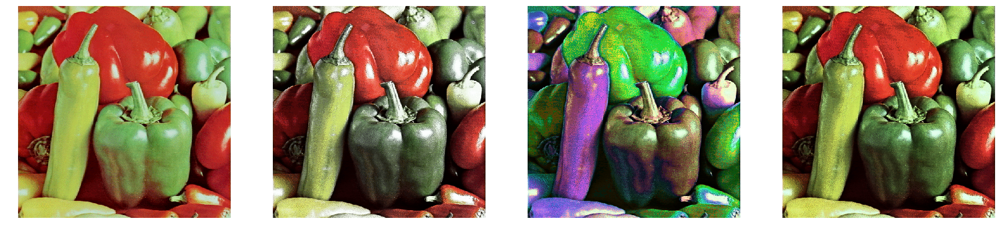

In [613]:
im = load_image('./images/peppers_color.png')

hsi = cv2.cvtColor(im,cv2.COLOR_RGB2HSV)
new_im_H = hsi.copy()
new_im_S = hsi.copy()
new_im_SH = hsi.copy()

new_im_S[:,:,0] = histogram_equalization(hsi[:,:,0])
new_im_H[:,:,1] = histogram_equalization(hsi[:,:,1])

new_im_H[:,:,2] = histogram_equalization(hsi[:,:,2])
new_im_S[:,:,2] = histogram_equalization(hsi[:,:,2])
new_im_SH[:,:,2] = histogram_equalization(hsi[:,:,2])

rgb_H = cv2.cvtColor(new_im_H,cv2.COLOR_HSV2RGB)
rgb_S = cv2.cvtColor(new_im_S,cv2.COLOR_HSV2RGB)
rgb_SH = cv2.cvtColor(new_im_SH,cv2.COLOR_HSV2RGB)
display_images([im,rgb_H,rgb_S,rgb_SH],(1,4))

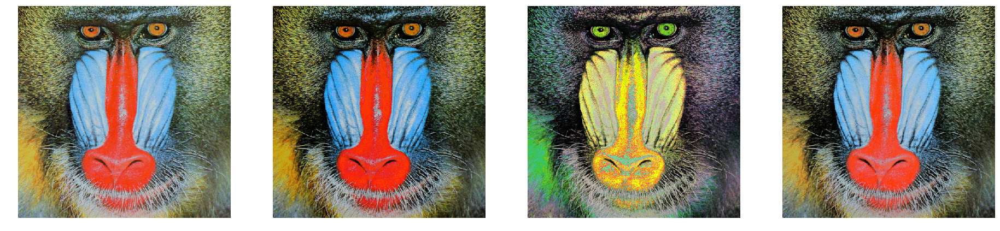

In [611]:
im = load_image('./images/mandril_color.tif')

hsi = cv2.cvtColor(im,cv2.COLOR_RGB2HSV)
new_im_H = hsi.copy()
new_im_S = hsi.copy()
new_im_SH = hsi.copy()

new_im_S[:,:,0] = histogram_equalization(hsi[:,:,0])
new_im_H[:,:,1] = histogram_equalization(hsi[:,:,1])

new_im_H[:,:,2] = histogram_equalization(hsi[:,:,2])
new_im_S[:,:,2] = histogram_equalization(hsi[:,:,2])
new_im_SH[:,:,2] = histogram_equalization(hsi[:,:,2])

rgb_H = cv2.cvtColor(new_im_H,cv2.COLOR_HSV2RGB)
rgb_S = cv2.cvtColor(new_im_S,cv2.COLOR_HSV2RGB)
rgb_SH = cv2.cvtColor(new_im_SH,cv2.COLOR_HSV2RGB)
display_images([im,rgb_H,rgb_S,rgb_SH],(1,4))